#### Imports

In [1]:
import pandas as pd 
import numpy as np 
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm.notebook import tqdm

import subprocess

# Video Processing

### Converting video types

In [2]:
# Convert file type from movie to mp4
input_file ='/Users/branndonmarion/Desktop/ProjectRepos/Video-Processing/data/videos/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg', '-i', 
                input_file, 
                '-qscale', '0',
                '026c7465-309f6d33.mp4',
                '-loglevel', 
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '/Users/branndonmarion/Desktop/ProjectRepos/Video-Processing/data/videos/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=0)

### Display video in notebook

In [3]:
ipd.Video('026c7465-309f6d33.mp4', width=800)

### Open video and read metadata

In [4]:
# Load in video capture
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [5]:
# Total number of frames in video
frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)

# Find height and width of video 
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)

# Find the video frame rate
fps = cap.get(cv2.CAP_PROP_FPS)


print(f'Frames : {frames}')
print(f'Height {height}, Width {width}')
print(f'FPS : {fps:0.2f}')

Frames : 2398.0
Height 720.0, Width 1280.0
FPS : 59.94


In [6]:
cap.release()

### Pull images from video

In [7]:
# Open the video file for reading using OpenCV's VideoCapture.
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

# Read the first frame from the video.
ret, img = cap.read()

# Print the return value and the shape of the image.
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [8]:
# Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10,10)):
    img_ = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

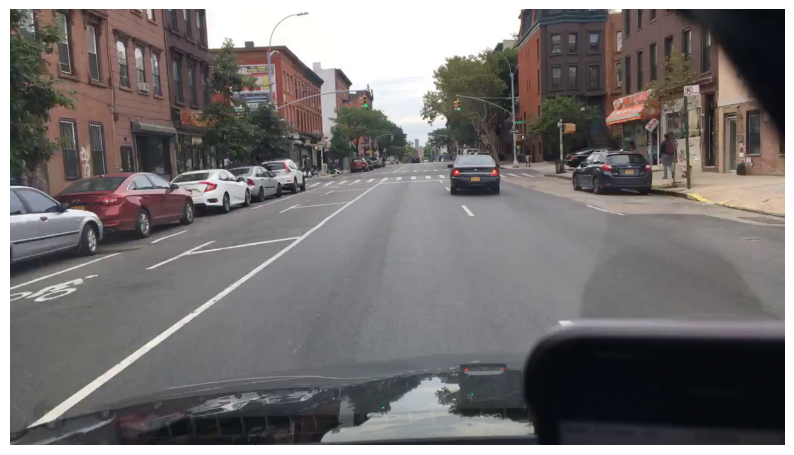

In [9]:
display_cv2_img(img)

In [10]:
cap.release()

### Display multiple frames from the video

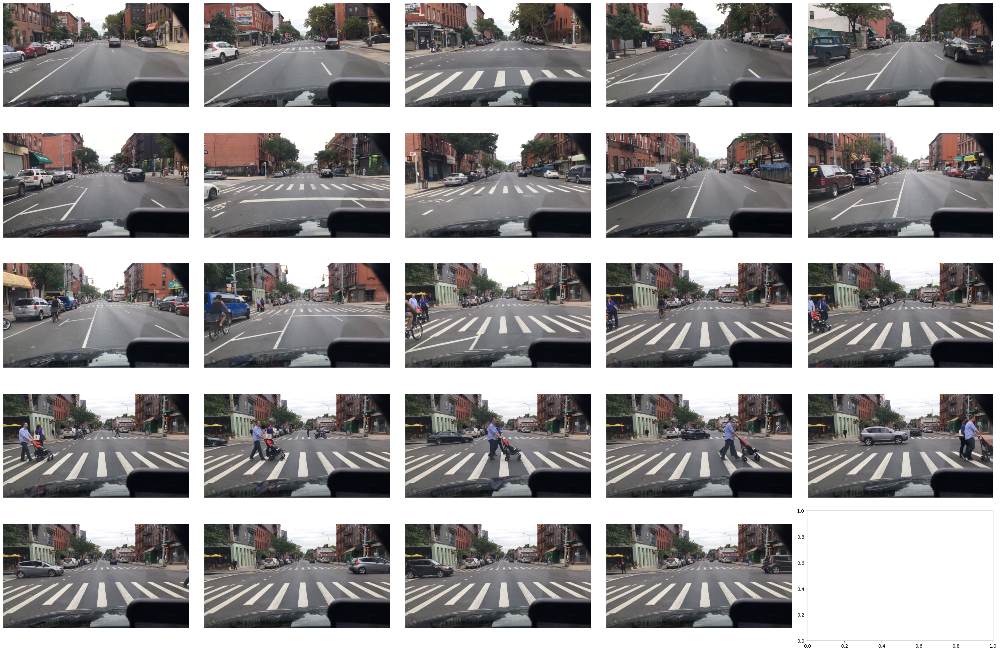

In [11]:
# Create a figure and a set of subplots with a grid of 5x5, and set the size of the figure.
fig, axs = plt.subplots(5, 5, figsize=(30, 20))

# Flatten the axs array to simplify iteration.
axs = axs.flatten()
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0

# Iterate through each frame in the video and display every 100 frames
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].axis('off')
        img_idx += 1
        
plt.tight_layout()
plt.show()
cap.release()

## Add annotation to video images

In [12]:
# Create labels DF
labels = pd.read_csv('/Users/branndonmarion/Desktop/ProjectRepos/Video-Processing/data/mot_labels.csv', low_memory=False)

# Filter labels DF for file labels
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)

# Align frame rate with file rate
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")
video_labels["category"].value_counts()

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [13]:
# Pull frame 1035
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

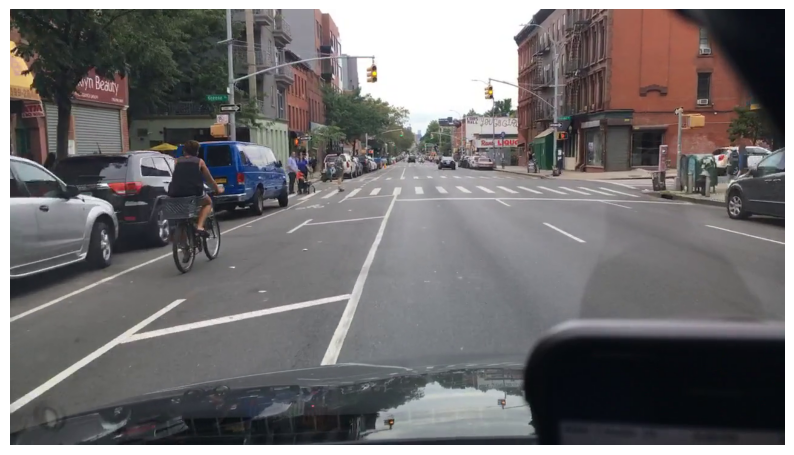

In [14]:
display_cv2_img(img)

### Display

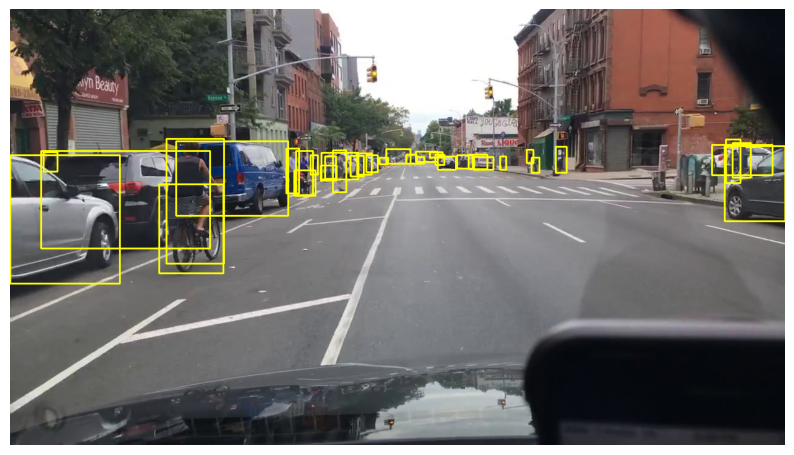

In [15]:
# Create a copy of the image for annotation visualization.
img_example = img.copy()

# Get the labels for a specific frame from the video_labels.
frame_labels = video_labels.query('video_frame == 1035')

# Iterate through each label and draw rectangles on the copied image.
for i, d in frame_labels.iterrows():
    # Get the coordinates of the top-left and bottom-right points of the bounding box.
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])

    cv2.rectangle(img_example, pt1, pt2, (0, 255, 255), 2)

display_cv2_img(img_example)

### Display: colroed by category

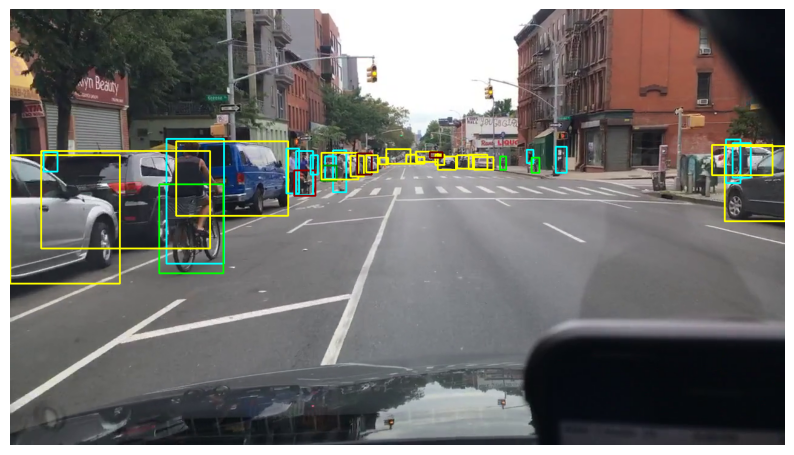

In [16]:
# Define a color map to associate specific colors with different categories.
color_map = {
    "car": (0, 255, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 255, 0),
    "other vehicle": (0, 0, 150),
    "rider": (255, 255, 0),
    "bicycle": (0, 255, 0),
    "other person": (255, 0, 255),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

# Create a copy of the image for annotation visualization.
img_example = img.copy()

# Get the labels for a specific frame from the video_labels.
frame_labels = video_labels.query('video_frame == 1035')

# Iterate through each label and draw rectangles on the copied image.
for i, d in frame_labels.iterrows():
    # Get the coordinates of the top-left and bottom-right points of the bounding box.
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])

    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 2)


display_cv2_img(img_example)

### Display: text

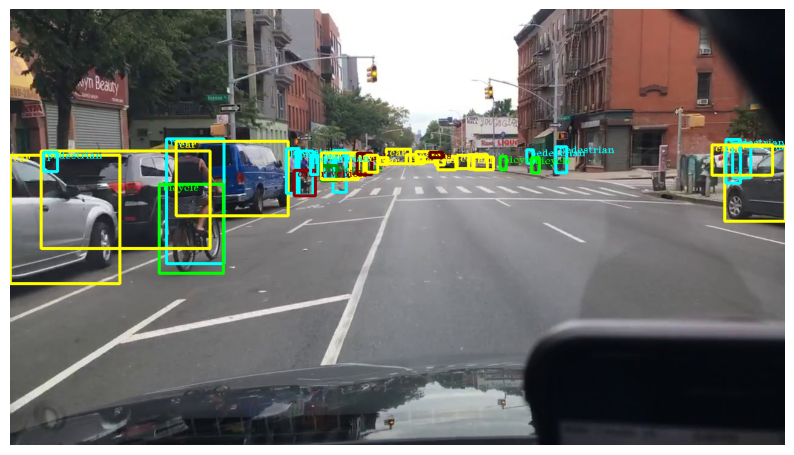

In [17]:
# Get the labels for the current frame from the video_labels.
frame_labels = video_labels.query("video_frame == @frame")

# Define the font for the text annotations.
font = cv2.FONT_HERSHEY_TRIPLEX

# Create a copy of the image for annotation visualization.
img_example = img.copy()

# Iterate through each label in the frame_labels and draw rectangles and add text annotations on the copied image.
for i, d in frame_labels.iterrows():
    # Get the coordinates of the top-left and bottom-right points of the bounding box.
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])

    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)

    
display_cv2_img(img_example)
cap.release()

### Label and output annoted video

In [18]:
def add_annotations(img, frame, video_labels):
    # Find the maximum frame number from the video_labels that is less than or equal to the current frame.
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()

    # Get the labels for the maximum frame number.
    frame_labels = video_labels.query("video_frame == @max_frame")

    # Loop through each label and draw a rectangle on the image.
    for i, d in frame_labels.iterrows():
        # Get the coordinates of the top-left and bottom-right points of the bounding box.
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])

        # Get the color associated with the category of the label.
        color = color_map[d["category"]]

        # Draw a rectangle on the image using the coordinates and color.
        img = cv2.rectangle(img, pt1, pt2, color, 3)

    # Return the image with annotations.
    return img

In [19]:
VIDEO_CODEC = "MP4V"
fps = 59.94
width = 1280
height = 720

# Create a VideoWriter object to write the output video.
out = cv2.VideoWriter("out_test.mp4", cv2.VideoWriter_fourcc(*VIDEO_CODEC),
               fps,
               (width, height))

# Load the input video.
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")

# Get the total number of frames in the input video.
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# Process each frame of the input video.
for frame in tqdm(range(n_frames)):
    ret, img = cap.read()
    if ret == False:
        break
    # Add annotations to the frame using the 'add_annotations' function and write to video
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


  0%|          | 0/2398 [00:00<?, ?it/s]

### Convert labeled output to mp4 and view

In [20]:
# Define the temporary output path for the uncompressed video.
tmp_output_path = "out_test.mp4"

# Define the output path for the compressed video.
output_path = "out_test_compressed.mp4"

# Use subprocess.run to execute the ffmpeg command for video compression.
subprocess.run(
    [
        "ffmpeg",                 # The command-line executable 'ffmpeg'.
        "-i",                     # Input option specifying the input file.
        tmp_output_path,          # Path to the input file.
        "-crf", "18",             # Constant Rate Factor (CRF) for controlling video quality (18 is a typical value).
        "-preset", "veryfast",    # Preset for compression speed and efficiency (veryfast is a fast preset).
        "-vcodec", "libx264",     # Video codec to be used for compression (libx264 is an H.264 codec).
        output_path,              # Path to the output file.
        '-loglevel', 'quiet'      # Option to silence FFmpeg's console output.
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [21]:
ipd.Video('out_test_compressed.mp4', width=800)

#### Branndon Marion